In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path
import os

def plot_tokenizer_comparison():
    # Define the image paths and their corresponding information
    image_info = [
        {
            'path': '/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/Cosmos-0.1-Tokenizer-DI8x8/graph_theory1_45850.png',
            'model': 'Cosmos-0.1-Tokenizer-DI8x8',
            'tokens': 45850
        },
        {
            'path': '/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/Cosmos-0.1-Tokenizer-DI16x16/graph_theory1_11397.png',
            'model': 'Cosmos-0.1-Tokenizer-DI16x16',
            'tokens': 11397
        },
        {
            'path': '/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/Emu3-VisionTokenizer/graph_theory1_16224.png',
            'model': 'Emu3-VisionTokenizer',
            'tokens': 16224
        },
        {
            'path': '/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/OpenMAGViT2/graph_theory1_11616.png',
            'model': 'OpenMAGViT2',
            'tokens': 11616
        }
    ]
    
    # Create figure with subplots in a row
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    # fig.suptitle('Image Tokenizer Comparison', fontsize=16, fontweight='bold')
    
    for i, info in enumerate(image_info):
        try:
            # Check if file exists
            if os.path.exists(info['path']):
                # Load and display image
                img = mpimg.imread(info['path'])
                axes[i].imshow(img)
                axes[i].axis('off')  # Hide axes
                
                # Add title with model name and token count
                title = f"{info['model']}\n{info['tokens']:,} tokens"
                axes[i].set_title(title, fontsize=10, fontweight='bold', pad=10)
            else:
                # If file doesn't exist, show placeholder
                axes[i].text(0.5, 0.5, f"Image not found:\n{info['model']}\n{info['tokens']:,} tokens", 
                           horizontalalignment='center', verticalalignment='center',
                           transform=axes[i].transAxes, fontsize=10, fontweight='bold')
                axes[i].set_xlim(0, 1)
                axes[i].set_ylim(0, 1)
                axes[i].axis('off')
                
        except Exception as e:
            # Handle any errors in loading images
            axes[i].text(0.5, 0.5, f"Error loading:\n{info['model']}\n{info['tokens']:,} tokens\n{str(e)}", 
                       horizontalalignment='center', verticalalignment='center',
                       transform=axes[i].transAxes, fontsize=8, fontweight='bold')
            axes[i].set_xlim(0, 1)
            axes[i].set_ylim(0, 1)
            axes[i].axis('off')
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Make room for the main title
    
    # Show the plot
    plt.show()

In [ ]:
def plot_tokenizer_comparison(image_base_name, base_path="/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets"):
    """
    Plot tokenizer comparison for four models.
    
    Args:
        image_base_name: The base image name (e.g., "graph_theory1")
        base_path: Base directory path containing model folders
    """
    
    # Define model folders and their display names
    models = [
        "Cosmos-0.1-Tokenizer-DI8x8",
        "Cosmos-0.1-Tokenizer-DI16x16", 
        "Emu3-VisionTokenizer",
        "OpenMAGViT2"
    ]
    
    # Function to find image file and extract token count
    def find_image_and_tokens(model_path, base_name):
        try:
            # Look for files matching the pattern: base_name_*.png
            if os.path.exists(model_path):
                files = os.listdir(model_path)
                matching_files = [f for f in files if f.startswith(base_name + '_') and f.endswith('.png')]
                
                if matching_files:
                    filename = matching_files[0]  # Take the first match
                    # Extract token count from filename
                    token_str = filename.split('_')[-1].replace('.png', '')
                    tokens = int(token_str)
                    return os.path.join(model_path, filename), tokens
                    
            return None, 0
        except Exception as e:
            print(f"Error finding image for {model_path}: {e}")
            return None, 0
    
    # Generate image info automatically
    image_info = []
    
    for model in models:
        # Handle special case for Emu3 path structure
        model_path = f"{base_path}/{model}"
            
        # Find the actual image file and extract token count
        full_path, tokens = find_image_and_tokens(model_path, image_base_name)
        
        image_info.append({
            'path': full_path,
            'model': model,
            'tokens': tokens
        })
    
    # Create figure with subplots in a row - bigger subplots, less space
    fig, axes = plt.subplots(1, 4, figsize=(30, 12))
    fig.subplots_adjust(wspace=0.1)  # Reduce horizontal space between subplots
    
    for i, info in enumerate(image_info):
        try:
            # Check if file exists
            if info['path'] and os.path.exists(info['path']):
                # Load and display image
                img = mpimg.imread(info['path'])
                axes[i].imshow(img)
                axes[i].axis('off')  # Hide axes
                
                # Add title with model name and token count
                title = f"{info['model']}\n{info['tokens']:,} tokens"
                axes[i].set_title(title, fontsize=14, fontweight='bold', pad=10)
            else:
                # If file doesn't exist, show placeholder
                axes[i].text(0.5, 0.5, f"Image not found:\n{info['model']}\nSearching for: {image_base_name}_*.png", 
                           horizontalalignment='center', verticalalignment='center',
                           transform=axes[i].transAxes, fontsize=8, fontweight='bold')
                axes[i].set_xlim(0, 1)
                axes[i].set_ylim(0, 1)
                axes[i].axis('off')
                
        except Exception as e:
            # Handle any errors in loading images
            axes[i].text(0.5, 0.5, f"Error loading:\n{info['model']}\n{str(e)}", 
                       horizontalalignment='center', verticalalignment='center',
                       transform=axes[i].transAxes, fontsize=8, fontweight='bold')
            axes[i].set_xlim(0, 1)
            axes[i].set_ylim(0, 1)
            axes[i].axis('off')
    
    # Minimal layout adjustment
    plt.tight_layout()
    
    # Show the plot
    plt.show()

In [ ]:
plot_tokenizer_comparison("math_draft1")


NameError: name 'plot_tokenizer_comparison' is not defined

In [28]:

def plot_tokenizer_ratio_comparison(image_base_name, model_name="Emu3VisionTokenizer", base_path="/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets"):
    """
    Plot tokenizer comparison for the same model across different compression ratios.
    
    Args:
        image_base_name: The base image name (e.g., "graph_theory1")
        model_name: The model name (default: "Emu3VisionTokenizer")
        base_path: Base directory path containing model folders
    """
    import os
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg
    
    # Function to find image file and extract token count
    def find_image_and_tokens(model_path, base_name):
        try:
            # Look for files matching the pattern: base_name_*.png
            if os.path.exists(model_path):
                files = os.listdir(model_path)
                matching_files = [f for f in files if f.startswith(base_name + '_') and f.endswith('.png')]
                
                if matching_files:
                    filename = matching_files[0]  # Take the first match
                    # Extract token count from filename
                    token_str = filename.split('_')[-1].replace('.png', '')
                    tokens = int(token_str)
                    return os.path.join(model_path, filename), tokens
                    
            return None, 0
        except Exception as e:
            print(f"Error finding image for {model_path}: {e}")
            return None, 0
    
    # Start with original image
    image_info = []
    
    # Add original image first
    original_path = None
    # Try different image formats for the original
    for ext in ['.png', '.jpg', '.jpeg']:
        potential_path = f"{base_path}/original/{image_base_name}{ext}"
        if os.path.exists(potential_path):
            original_path = potential_path
            break
    
    # If no original found, use the first format as fallback for error display
    if original_path is None:
        original_path = f"{base_path}/original/{image_base_name}.png"
    
    image_info.append({
        'path': original_path,
        'model': 'Original',
        'ratio': 'N/A',
        'tokens': 'N/A'
    })
    
    # Define ratio folders for the specified model
    ratio_folders = []
    
    # First, check for base model folder (1:1 ratio)
    base_model_path = f"{base_path}/{model_name}"
    if os.path.exists(base_model_path):
        ratio_folders.append((base_model_path, "1:1", 1.0))
    
    # Look for ratio folders
    if os.path.exists(base_path):
        all_folders = os.listdir(base_path)
        ratio_pattern_folders = [f for f in all_folders if f.startswith(f"{model_name}_ratio_")]
        
        # Collect ratio folders with their values
        for folder in ratio_pattern_folders:
            try:
                ratio_str = folder.split('_ratio_')[1]
                ratio_value = round(float(ratio_str), 3)  # Round to 3 decimal places
                ratio_folders.append((f"{base_path}/{folder}", f"1:{ratio_value}", ratio_value))
            except:
                continue
        
        # Sort by ratio value (1:1 first, then descending order)
        ratio_folders.sort(key=lambda x: x[2], reverse=True)
    
    # Add model reconstructions for each ratio
    for folder_path, display_name, ratio_value in ratio_folders:
        full_path, tokens = find_image_and_tokens(folder_path, image_base_name)
        
        image_info.append({
            'path': full_path,
            'model': display_name,
            'ratio': ratio_value,
            'tokens': tokens
        })
    
    # Create figure with subplots (original + ratio variants)
    num_plots = len(image_info)
    fig, axes = plt.subplots(1, num_plots, figsize=(12 * num_plots, 16))
    
    # Handle case where there's only one subplot
    if num_plots == 1:
        axes = [axes]
    
    fig.subplots_adjust(wspace=0.1)  # Reduce horizontal space between subplots
    
    for i, info in enumerate(image_info):
        try:
            # Check if file exists
            if info['path'] and os.path.exists(info['path']):
                # Load and display image
                img = mpimg.imread(info['path'])
                axes[i].imshow(img)
                axes[i].axis('off')  # Hide axes
                
                # Add title with model name and token count
                if info['model'] == 'Original':
                    title = f"{info['model']}"
                else:
                    title = f"{model_name}\n{info['model']}\n{info['tokens']:,} tokens"
                
                axes[i].set_title(title, fontsize=14, fontweight='bold', pad=10)
                
                # Add border to original image to distinguish it
                if info['model'] == 'Original':
                    for spine in axes[i].spines.values():
                        spine.set_edgecolor('gold')
                        spine.set_linewidth(3)
                        spine.set_visible(True)
                
            else:
                # If file doesn't exist, show placeholder
                if info['model'] == 'Original':
                    error_msg = f"Original not found:\n{original_path}"
                else:
                    error_msg = f"Image not found:\n{info['model']}\nSearching for: {image_base_name}_*.png"
                
                axes[i].text(0.5, 0.5, error_msg, 
                           horizontalalignment='center', verticalalignment='center',
                           transform=axes[i].transAxes, fontsize=8, fontweight='bold')
                axes[i].set_xlim(0, 1)
                axes[i].set_ylim(0, 1)
                axes[i].axis('off')
                
        except Exception as e:
            # Handle any errors in loading images
            axes[i].text(0.5, 0.5, f"Error loading:\n{info['model']}\n{str(e)}", 
                       horizontalalignment='center', verticalalignment='center',
                       transform=axes[i].transAxes, fontsize=8, fontweight='bold')
            axes[i].set_xlim(0, 1)
            axes[i].set_ylim(0, 1)
            axes[i].axis('off')
    
    # Minimal layout adjustment
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Convenience function to quickly compare ratios for a specific image and model
def compare_ratios(image_name, model="Emu3VisionTokenizer"):
    """
    Quick function to compare different compression ratios for a specific image and model
    
    Args:
        image_name: Just the base name like "graph_theory1" (without .png)
        model: Model name (default: "Emu3VisionTokenizer")
    """
    print(f"Comparing ratios for model {model} on image: {image_name}")
    plot_tokenizer_ratio_comparison(image_name, model)

Comparing ratios for model flowmo_hi_tiled_256 on image: logo2


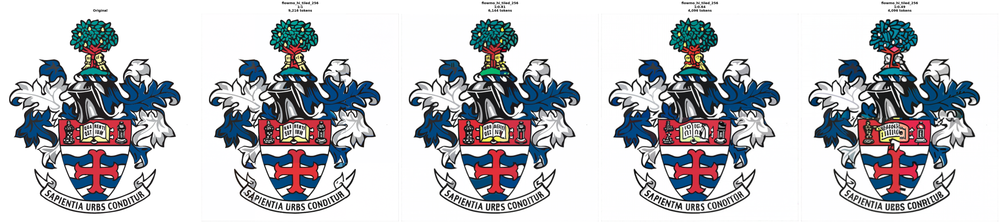

In [45]:
# compare_ratios("math_draft1", model='flowmo_hi_tiled_256') # flowmo_hi_tiled_256
compare_ratios("logo2", model='flowmo_hi_tiled_256') 

Comparing ratios for model unitok on image: line_chart


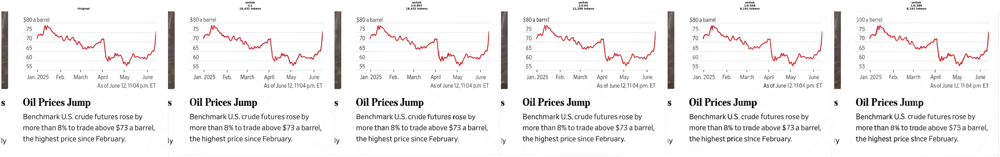

In [ ]:
compare_ratios("line_chart", model='flowmo_hi_tiled_256') # flowmo_hi_tiled_256
# compare_ratios("menu", model='unitok') 

In [ ]:
compare_ratios("menu", model='tokenflow_384')